In [1]:
import mne
import matplotlib.pyplot as plt
import numpy as np

In [2]:
raw = mne.io.read_raw_edf('C:/Users/Pushkar Khetrapal/Documents/BCI/files/S001/S001R04.edf', preload = True)

Extracting EDF parameters from C:\Users\Pushkar Khetrapal\Documents\BCI\files\S001\S001R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


In [3]:
raw.rename_channels(lambda s: s.strip('.'))

In [4]:
raw.ch_names

['Fc5',
 'Fc3',
 'Fc1',
 'Fcz',
 'Fc2',
 'Fc4',
 'Fc6',
 'C5',
 'C3',
 'C1',
 'Cz',
 'C2',
 'C4',
 'C6',
 'Cp5',
 'Cp3',
 'Cp1',
 'Cpz',
 'Cp2',
 'Cp4',
 'Cp6',
 'Fp1',
 'Fpz',
 'Fp2',
 'Af7',
 'Af3',
 'Afz',
 'Af4',
 'Af8',
 'F7',
 'F5',
 'F3',
 'F1',
 'Fz',
 'F2',
 'F4',
 'F6',
 'F8',
 'Ft7',
 'Ft8',
 'T7',
 'T8',
 'T9',
 'T10',
 'Tp7',
 'Tp8',
 'P7',
 'P5',
 'P3',
 'P1',
 'Pz',
 'P2',
 'P4',
 'P6',
 'P8',
 'Po7',
 'Po3',
 'Poz',
 'Po4',
 'Po8',
 'O1',
 'Oz',
 'O2',
 'Iz']

In [128]:
raw.annotations

<Annotations  |  30 segments : T0 (15), T2 (7), T1 (8), orig_time : 2009-08-12 16:15:00>

In [129]:
print(set(raw.annotations.duration))
print(set(raw.annotations.description))
print(raw.annotations.onset[0])

{4.2, 4.1}
{'T0', 'T2', 'T1'}
0.0


In [130]:
events_from_annot, event_dict = mne.events_from_annotations(raw)
print(event_dict)
print(len(events_from_annot))

Used Annotations descriptions: ['T0', 'T1', 'T2']
{'T0': 1, 'T1': 2, 'T2': 3}
30


In [131]:
events_from_annot

array([[    0,     0,     1],
       [  672,     0,     3],
       [ 1328,     0,     1],
       [ 2000,     0,     2],
       [ 2656,     0,     1],
       [ 3328,     0,     2],
       [ 3984,     0,     1],
       [ 4656,     0,     3],
       [ 5312,     0,     1],
       [ 5984,     0,     3],
       [ 6640,     0,     1],
       [ 7312,     0,     2],
       [ 7968,     0,     1],
       [ 8640,     0,     3],
       [ 9296,     0,     1],
       [ 9968,     0,     2],
       [10624,     0,     1],
       [11296,     0,     3],
       [11952,     0,     1],
       [12624,     0,     2],
       [13280,     0,     1],
       [13952,     0,     2],
       [14608,     0,     1],
       [15280,     0,     3],
       [15936,     0,     1],
       [16608,     0,     2],
       [17264,     0,     1],
       [17936,     0,     3],
       [18592,     0,     1],
       [19264,     0,     2]])

In [132]:
raw.set_eeg_reference("average", projection = True)

Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.


<RawEDF  |  S001R04.edf, n_channels x n_times : 64 x 20000 (125.0 sec), ~9.9 MB, data loaded>

4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 93 unique labels.


c:\users\pushkar khetrapal\appdata\local\programs\python\python37\lib\site-packages\mne\utils\docs.py:830: DeprecationWarning: Function read_montage is deprecated; ``read_montage`` is deprecated and will be removed in v0.20. Please use ``read_dig_fif``, ``read_dig_egi``, ``read_custom_montage``, or ``read_dig_captrack`` to read a digitization based on your needs instead; or ``make_standard_montage`` to create ``DigMontage`` based on template; or ``make_dig_montage`` to create a ``DigMontage`` out of np.arrays
  warnings.warn(msg, category=DeprecationWarning)
c:\users\pushkar khetrapal\appdata\local\programs\python\python37\lib\site-packages\mne\utils\docs.py:813: DeprecationWarning: Class Montage is deprecated; Montage class is deprecated and will be removed in v0.20. Please use DigMontage instead.
  warnings.warn(msg, category=DeprecationWarning)
<ipython-input-133-1b7f1366514e>:2: DeprecationWarning: Setting a montage using anything rather than DigMontage is deprecated and will raise

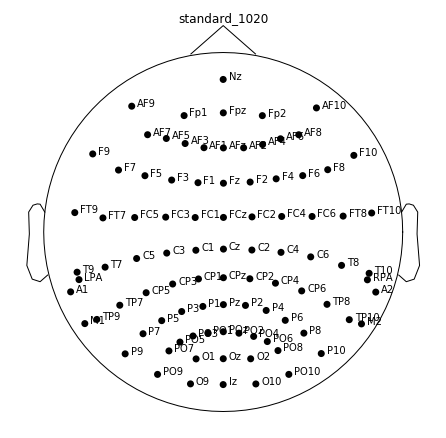

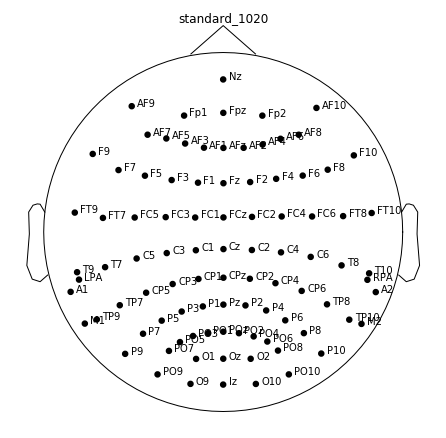

In [133]:
montage = mne.channels.read_montage("standard_1020")
raw.set_montage(montage)
montage.plot()

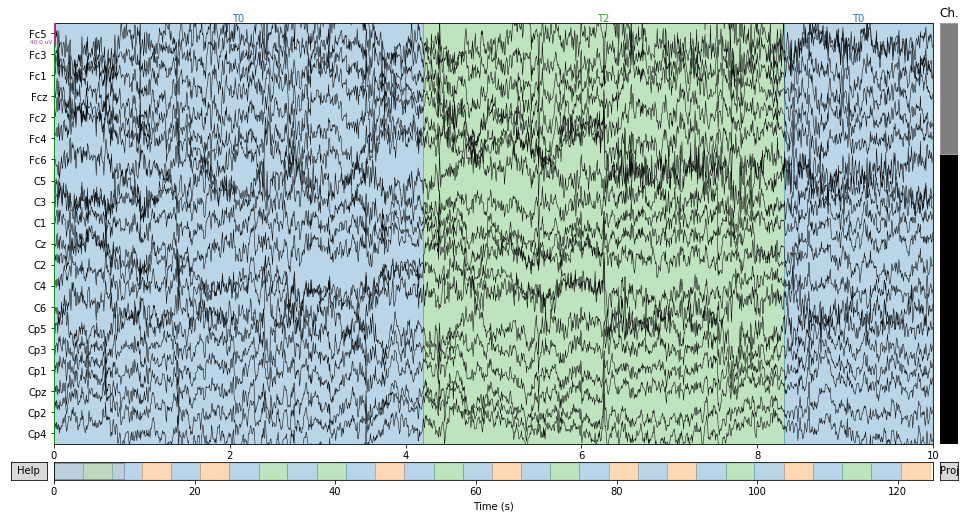

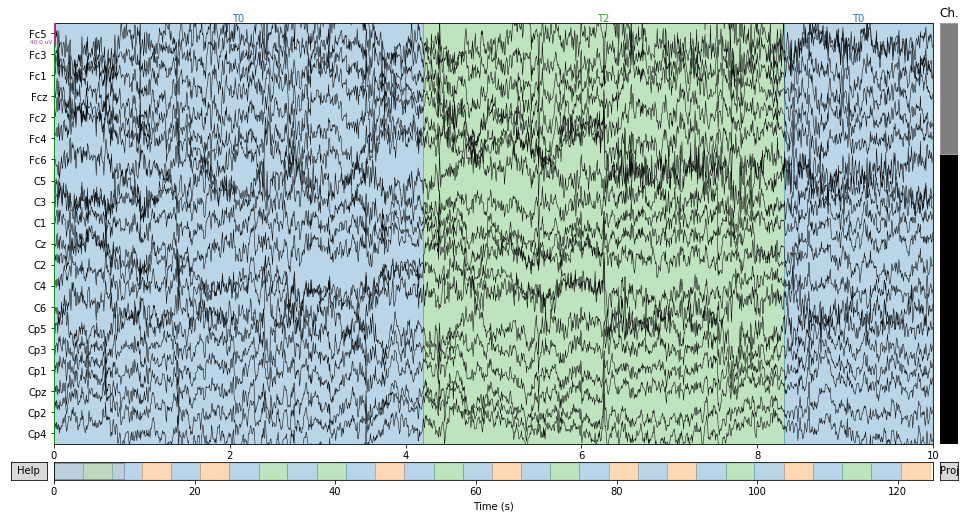

In [134]:
raw.plot()

In [149]:
from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs, corrmap)

In [150]:
ica = ICA(n_components=15, random_state=97)
ica.fit(raw)

Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selection by number: 15 components
Fitting ICA took 0.9s.


<ICA  |  raw data decomposition, fit (fastica): 20000 samples, 15 components, channels used: "eeg">

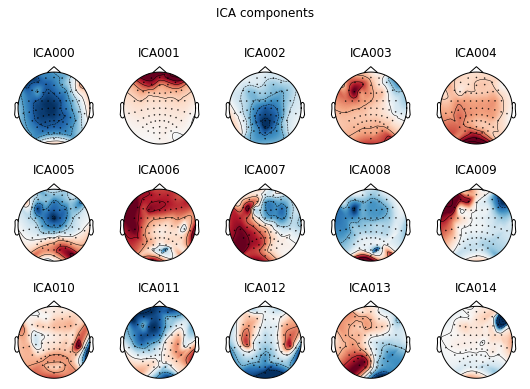

[<Figure size 540x396 with 15 Axes>]

In [151]:
ica.plot_components()

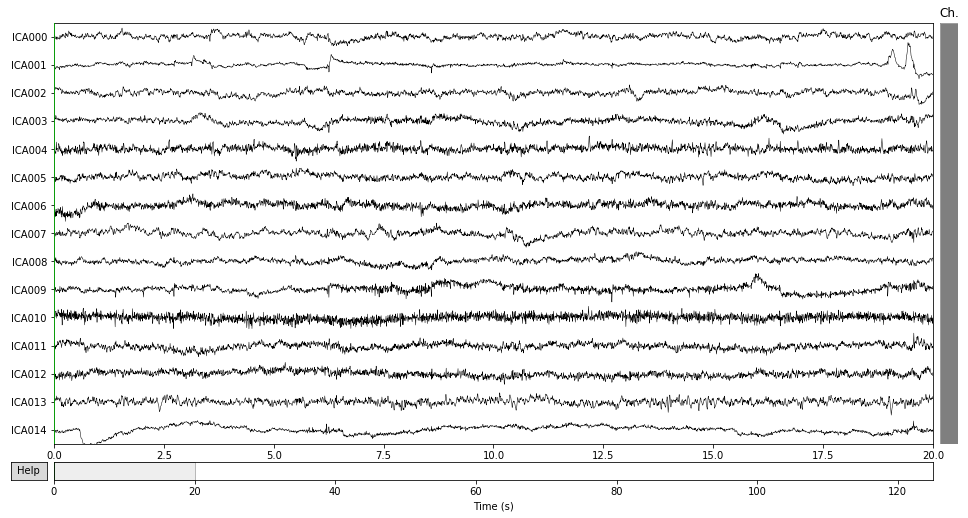

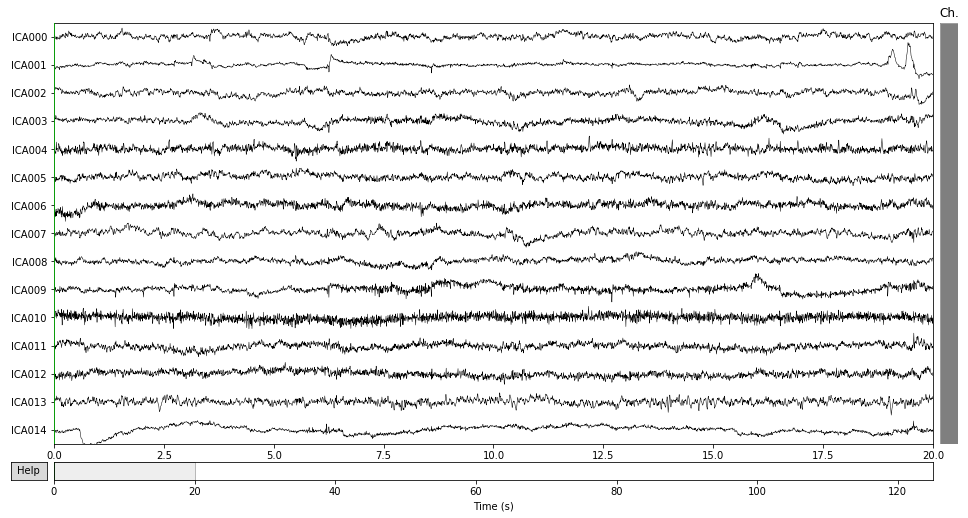

In [152]:
ica.plot_sources(raw)

Transforming to ICA space (15 components)
Zeroing out 1 ICA components


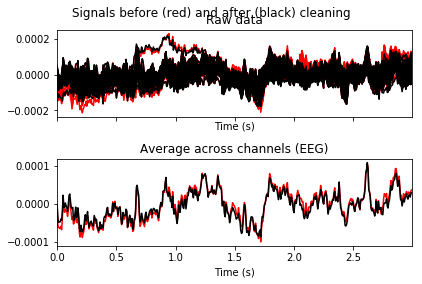

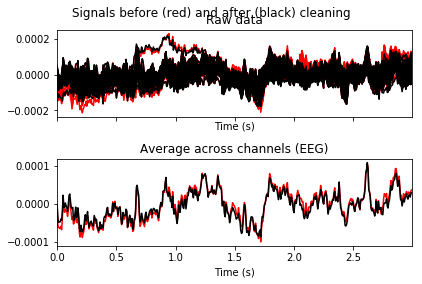

In [153]:
# blinks
ica.plot_overlay(raw, exclude=[1], picks='eeg')

    Using multitaper spectrum estimation with 7 DPSS windows
62 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
62 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


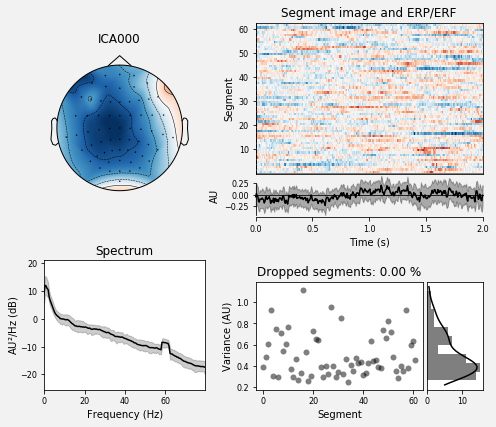

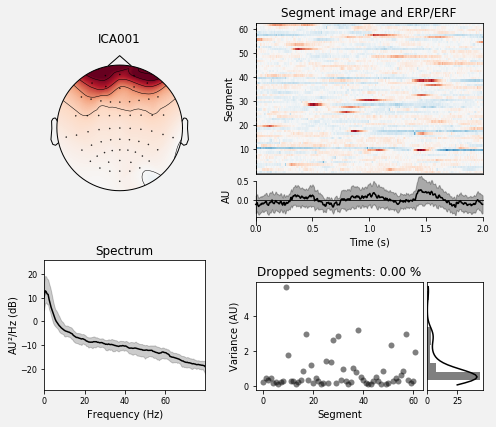

[<Figure size 504x432 with 6 Axes>, <Figure size 504x432 with 6 Axes>]

In [154]:
ica.plot_properties(raw, picks=[0, 1])

In [155]:
ica.apply(raw)

Transforming to ICA space (15 components)
Zeroing out 0 ICA components


<RawEDF  |  S001R04.edf, n_channels x n_times : 64 x 20000 (125.0 sec), ~9.9 MB, data loaded>

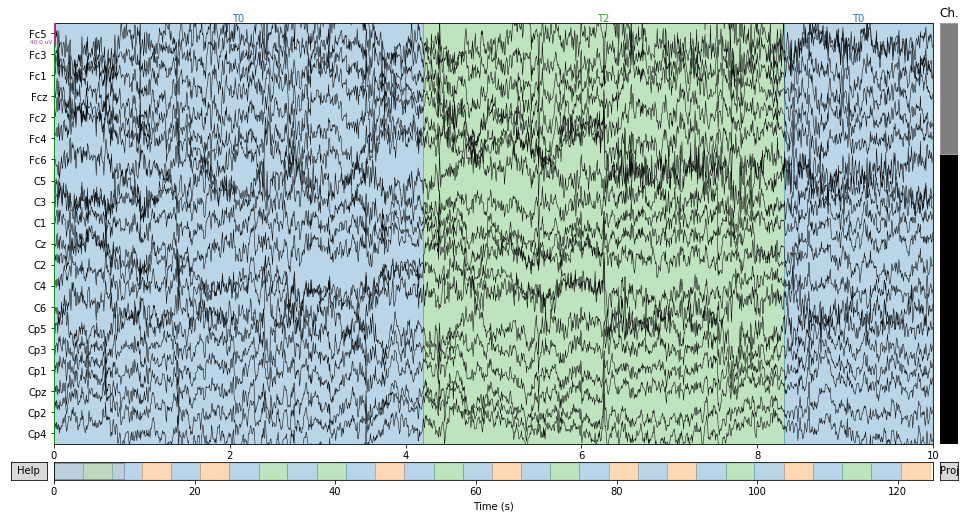

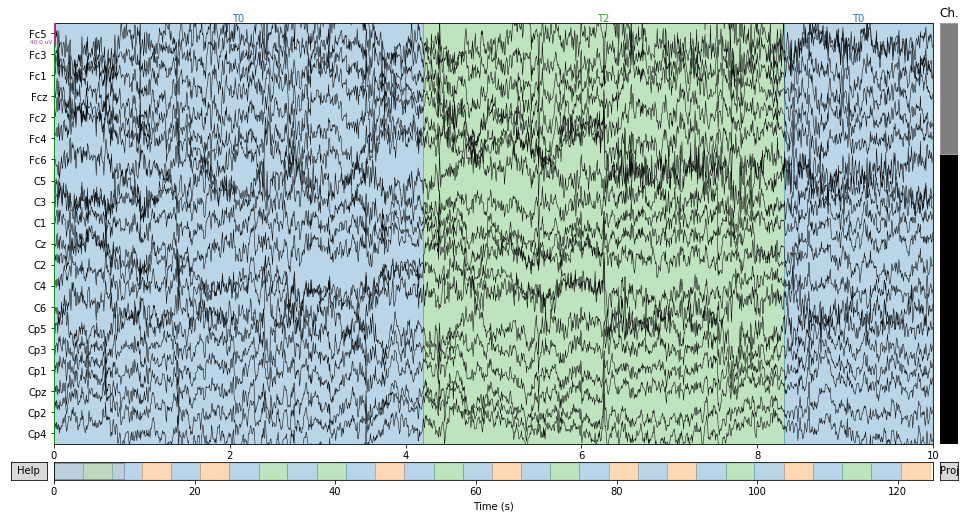

In [66]:
raw.plot()

In [168]:
raw.filter(l_freq=6, h_freq=40)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 6 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 6.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 265 samples (1.656 sec)



<RawEDF  |  S001R04.edf, n_channels x n_times : 64 x 20000 (125.0 sec), ~9.9 MB, data loaded>

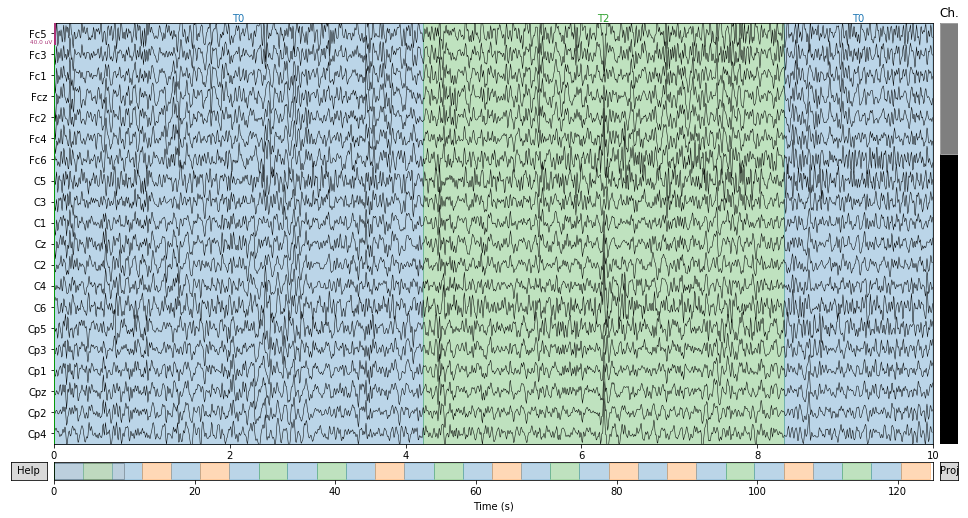

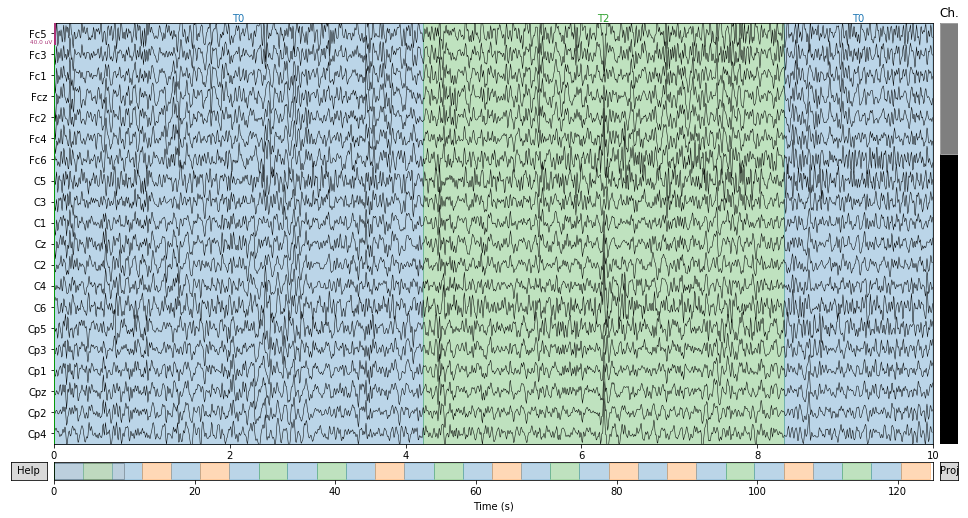

In [169]:
raw.plot()

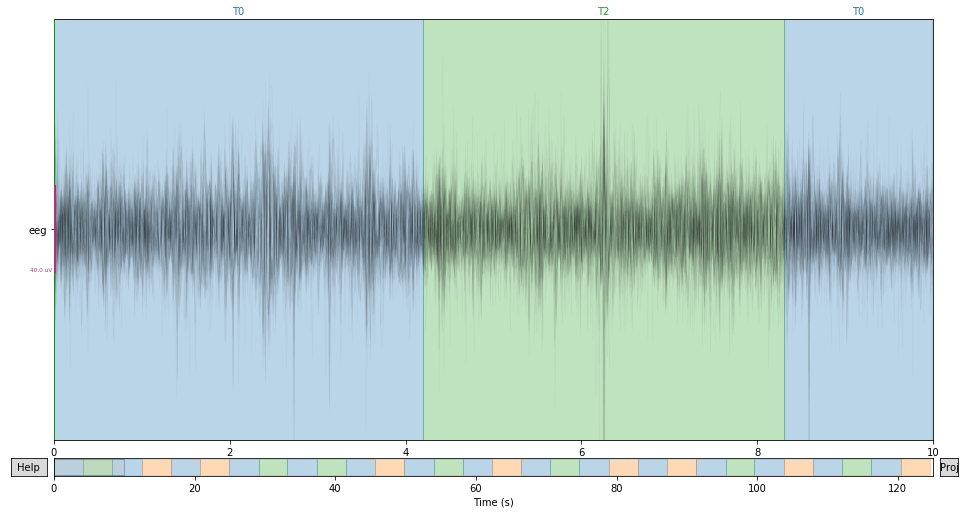

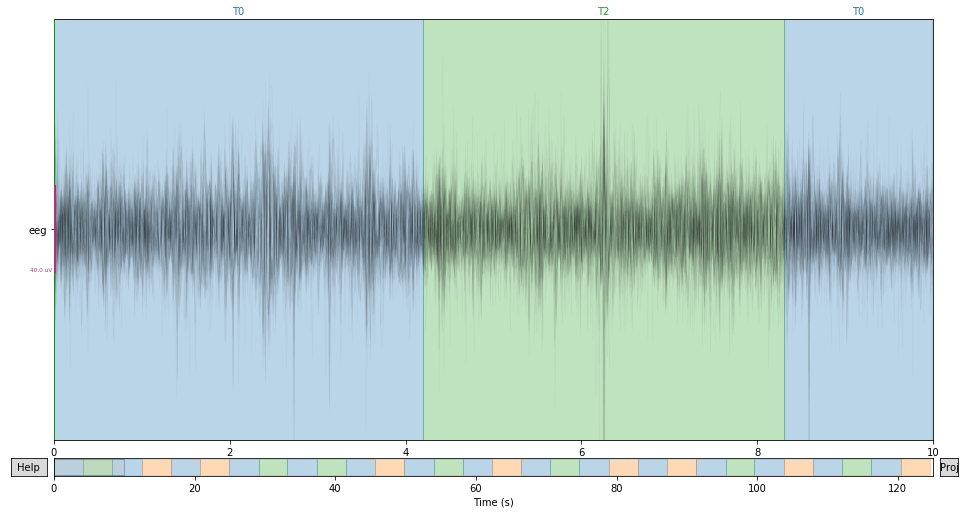

In [170]:
raw.plot(butterfly=True, color='#00000009', bad_color='r')

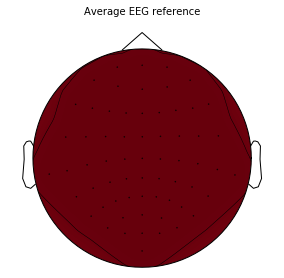

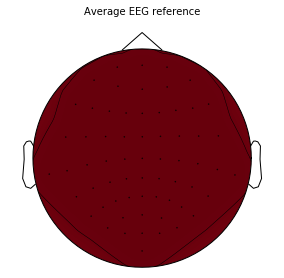

In [201]:
title = 'EEG Custom reference'
raw.plot_projs_topomap()

In [171]:
events = events_from_annot

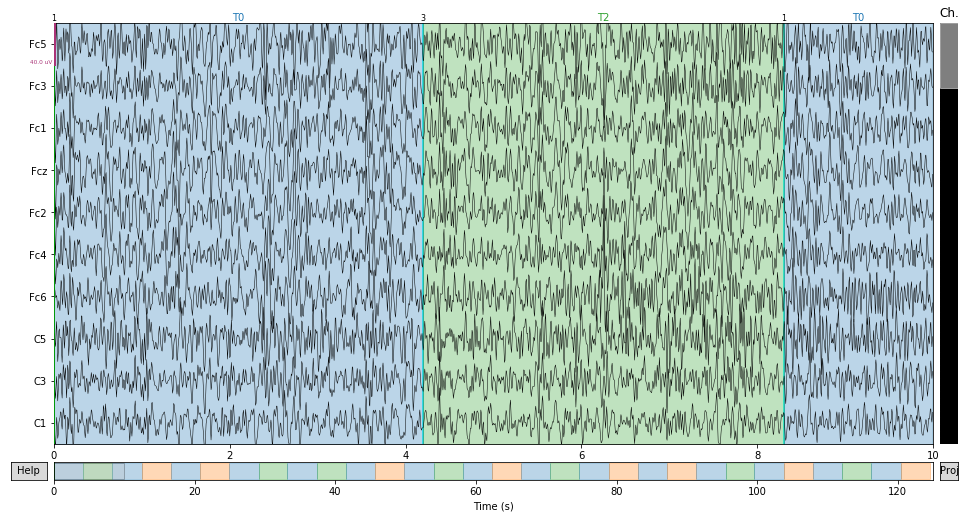

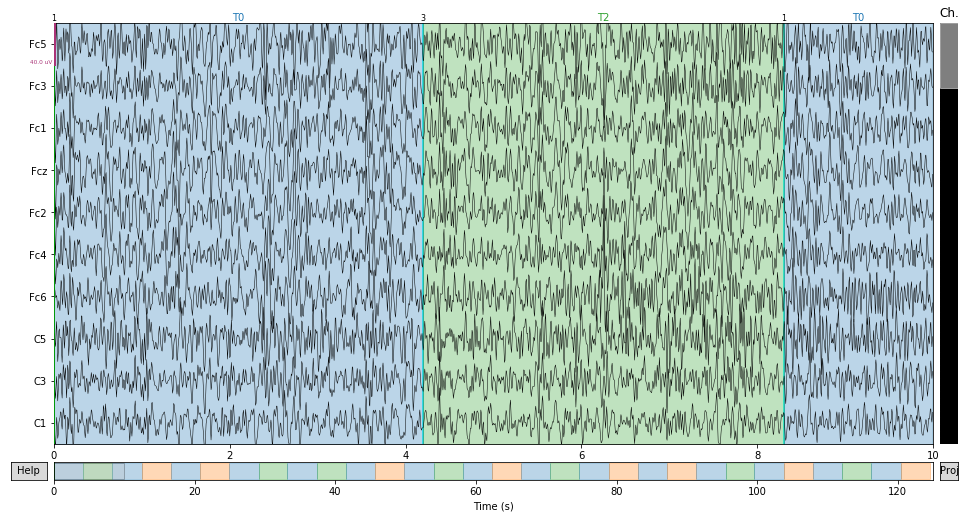

In [172]:
raw.plot(events=events, n_channels=10)

Found 30 events, first five:
[[   0    0    1]
 [ 672    0    3]
 [1328    0    1]
 [2000    0    2]
 [2656    0    1]]


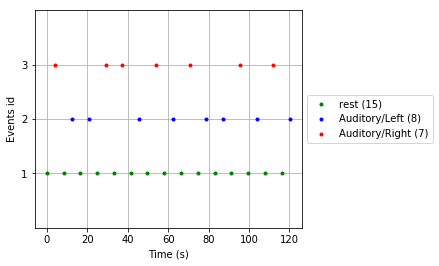

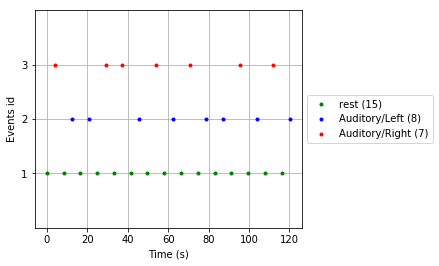

In [173]:
print('Found %s events, first five:' % len(events))
print(events[:5])

# Plot the events to get an idea of the paradigm
# Specify colors and an event_id dictionary for the legend.
event_id = {'Auditory/Left': 2, 'Auditory/Right': 3,
            'rest': 1}
color = {1: 'green', 2: 'blue', 3: 'red'}

mne.viz.plot_events(events, raw.info['sfreq'], raw.first_samp, color=color,
                    event_id=event_id)

In [174]:
events

array([[    0,     0,     1],
       [  672,     0,     3],
       [ 1328,     0,     1],
       [ 2000,     0,     2],
       [ 2656,     0,     1],
       [ 3328,     0,     2],
       [ 3984,     0,     1],
       [ 4656,     0,     3],
       [ 5312,     0,     1],
       [ 5984,     0,     3],
       [ 6640,     0,     1],
       [ 7312,     0,     2],
       [ 7968,     0,     1],
       [ 8640,     0,     3],
       [ 9296,     0,     1],
       [ 9968,     0,     2],
       [10624,     0,     1],
       [11296,     0,     3],
       [11952,     0,     1],
       [12624,     0,     2],
       [13280,     0,     1],
       [13952,     0,     2],
       [14608,     0,     1],
       [15280,     0,     3],
       [15936,     0,     1],
       [16608,     0,     2],
       [17264,     0,     1],
       [17936,     0,     3],
       [18592,     0,     1],
       [19264,     0,     2]])

In [175]:
tmin, tmax = -0.2, 0.5
event_id = {'Auditory/Left': 2, 'Auditory/Right': 3}

baseline = (None, 0.0)
epochs = mne.Epochs(raw, events=events, event_id=event_id, tmin=tmin,
                    tmax=tmax, baseline=baseline,
                    picks=('eeg'))  # only include EEG

15 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
Created an SSP operator (subspace dimension = 1)
1 projection items activated


Loading data for 15 events and 113 original time points ...
0 bad epochs dropped
Loading data for 15 events and 113 original time points ...
Loading data for 15 events and 113 original time points ...


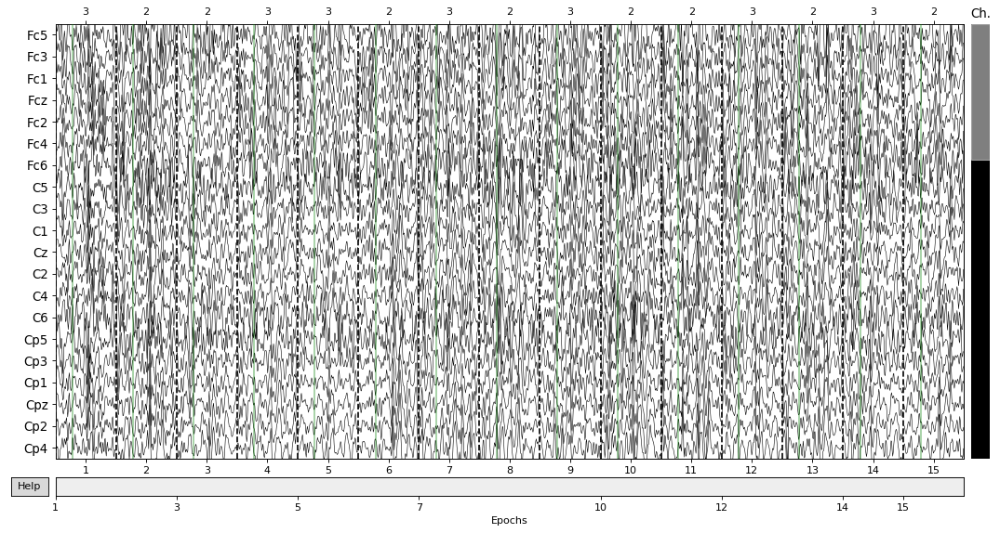

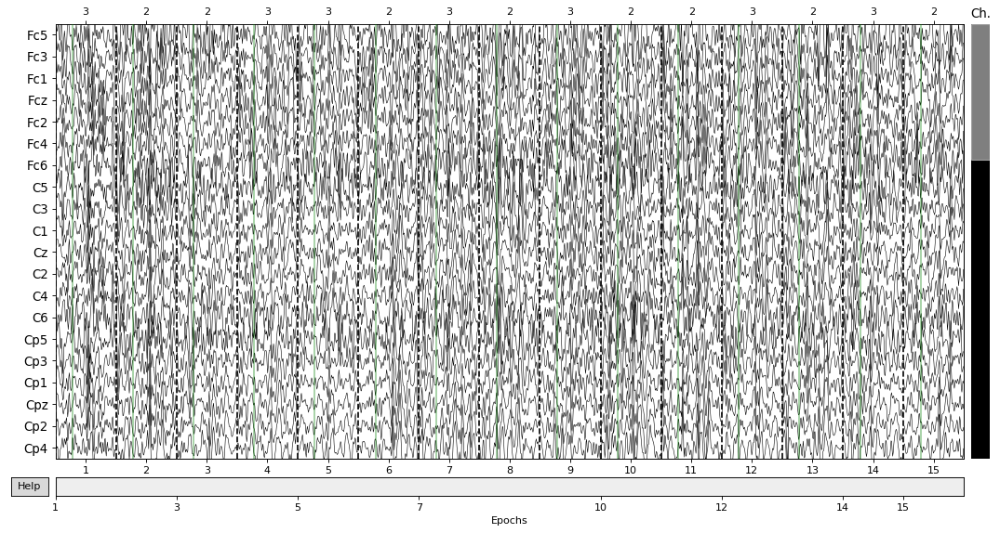

In [176]:
epochs.plot(block=True)

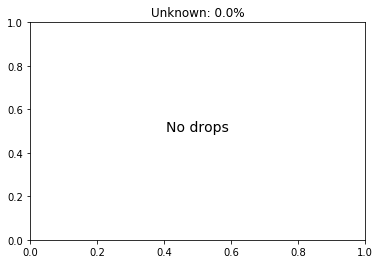

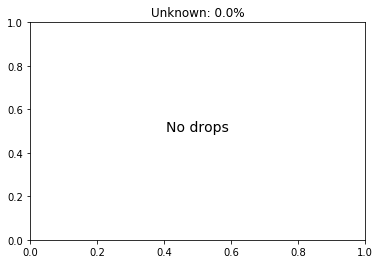

In [177]:
epochs.plot_drop_log()

In [178]:
picks = mne.pick_types(epochs.info, meg=False, eeg=True)
evoked_left = epochs['Auditory/Left'].average(picks=picks)
evoked_right = epochs['Auditory/Right'].average(picks=picks)

In [179]:
epochs_left = epochs['Left']

# ... or to select a very specific subset. This is the same as above:
evoked_left_again = epochs['Left/Auditory'].average(picks=picks)

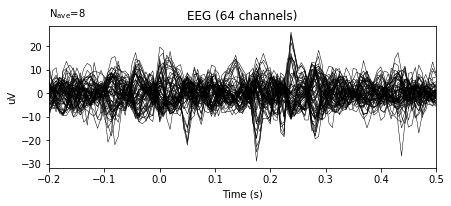

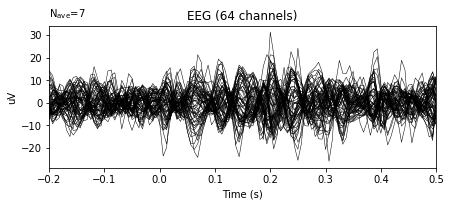

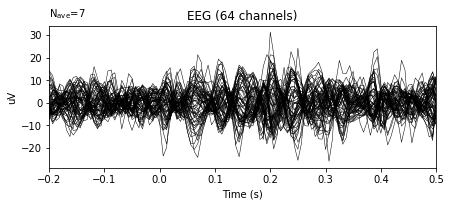

In [180]:
evoked_left.plot(time_unit='s')
evoked_right.plot(time_unit='s')

In [181]:
for ep in epochs_left[:1]:
    print(ep)

[[-4.26533224e-06  3.74242522e-06  4.80097722e-06 ...  8.55893185e-06
  -2.26191005e-05 -2.08476118e-05]
 [ 3.64667120e-06  8.99202633e-06  7.68145914e-06 ... -3.22930888e-06
  -2.82182228e-05 -1.95679226e-05]
 [ 1.27790490e-05  1.77641172e-05  1.63494688e-05 ... -1.64349162e-05
  -2.96933776e-05 -1.83209789e-05]
 ...
 [ 2.83075953e-06 -8.59818299e-06 -5.81484142e-06 ...  1.82255531e-06
   1.43740098e-05  1.86356876e-05]
 [-4.31800566e-06 -2.51495495e-05 -2.18049890e-05 ...  8.39072145e-06
   2.21308077e-05  1.81962538e-05]
 [ 1.70637488e-05  1.47397500e-05  1.66231855e-05 ...  1.92827396e-05
   3.66093080e-05  3.29908053e-05]]


Loading data for 15 events and 113 original time points ...
15 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


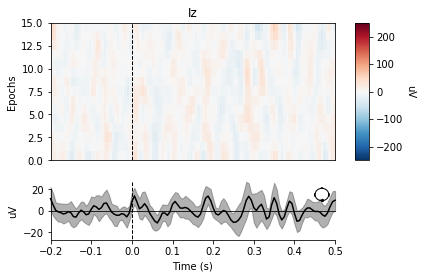

[<Figure size 432x288 with 4 Axes>]

In [182]:
epochs.plot_image(63, cmap='interactive', sigma=1., vmin=-250, vmax=250)

Loading data for 15 events and 113 original time points ...
15 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
combining channels using "gfp"


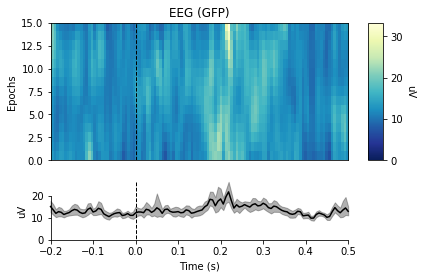

[<Figure size 432x288 with 3 Axes>]

In [183]:
epochs.plot_image(combine='gfp', sigma=2., cmap="YlGnBu_r")

Loading data for 15 events and 113 original time points ...


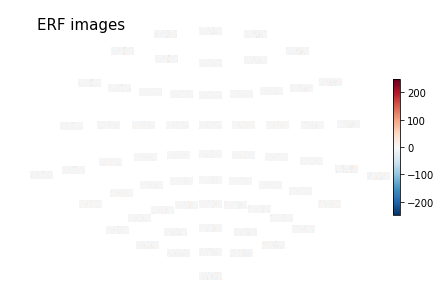

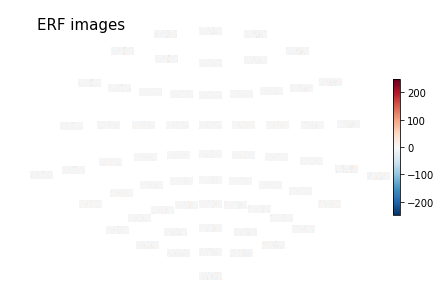

In [184]:
epochs.plot_topo_image(vmin=-250, vmax=250, title='ERF images', sigma=2.,
                       fig_facecolor='w', font_color='k')

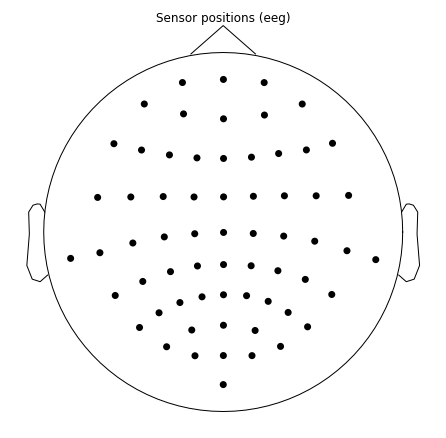

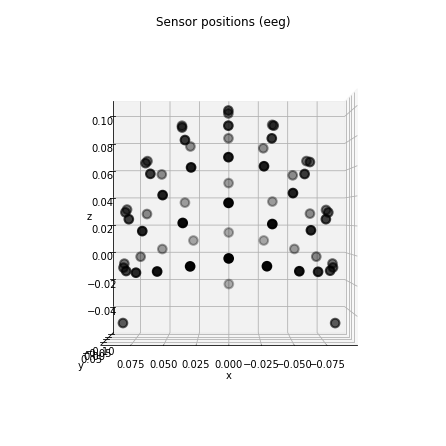

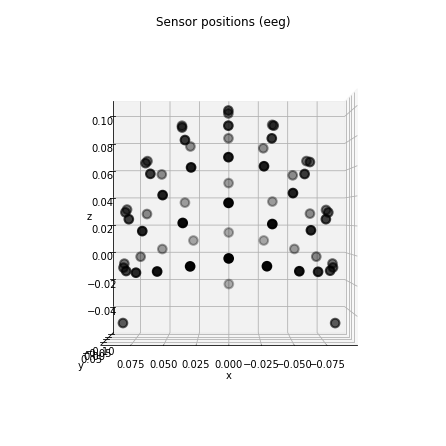

In [185]:
raw.plot_sensors()
raw.plot_sensors('3d')

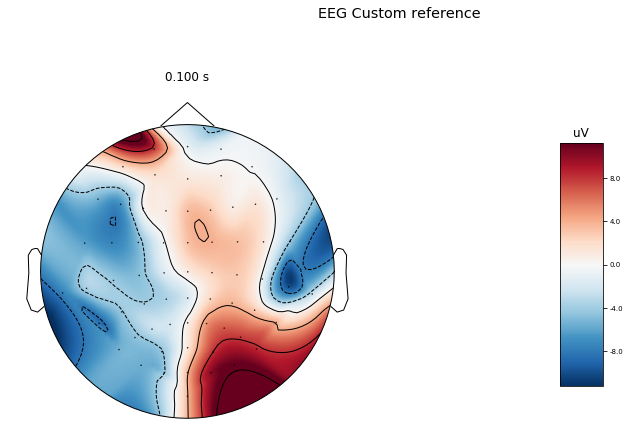

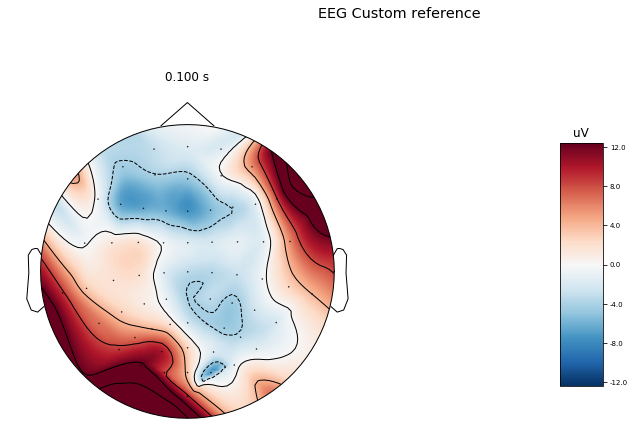

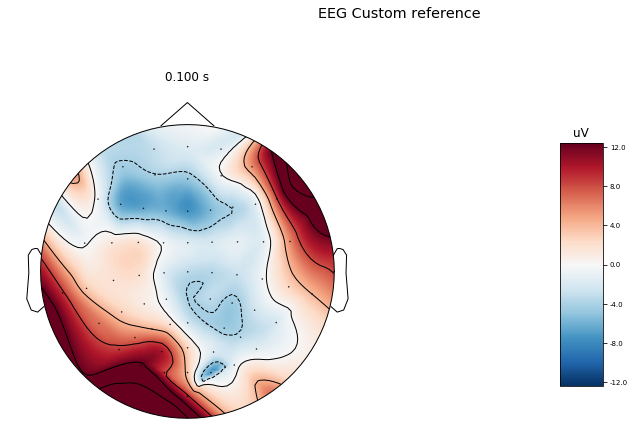

In [203]:
title = 'EEG Custom reference'
evoked_left.plot_topomap(times=[0.1], size=4., title=title, time_unit='s')
evoked_right.plot_topomap(times=[0.1], size=4., title=title, time_unit='s')

# Difference in ERP of left and right

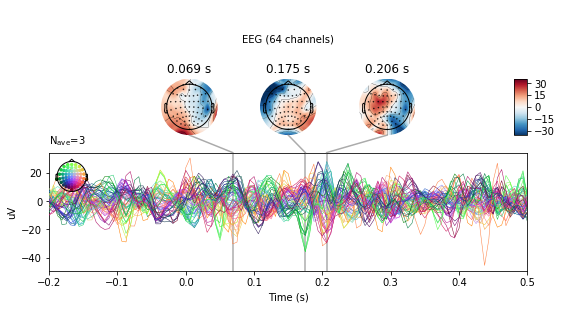

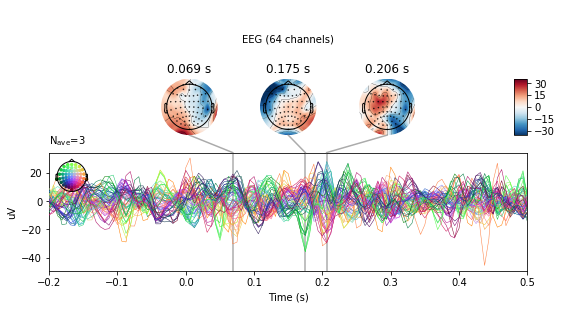

In [205]:
left, right = epochs["Auditory/Left"].average(), epochs["Auditory/Right"].average()

# create and plot difference ERP
joint_kwargs = dict(ts_args=dict(time_unit='s'),
                    topomap_args=dict(time_unit='s'))
mne.combine_evoked([left, -right], weights='equal').plot_joint(**joint_kwargs)

In [211]:
data = left.data

In [214]:
data.shape

(64, 113)

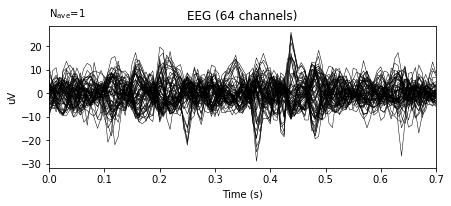

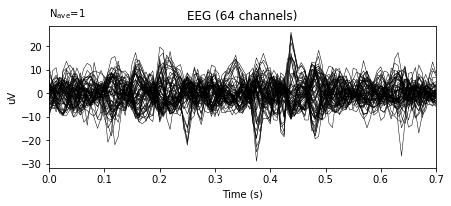

In [221]:
evoked = mne.EvokedArray(data, raw.info, tmin=raw.times[0])
evoked.plot(time_unit='s')

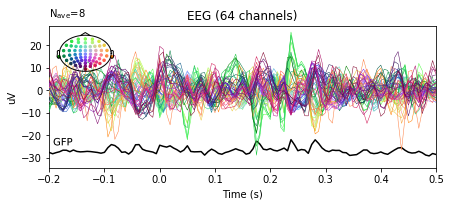

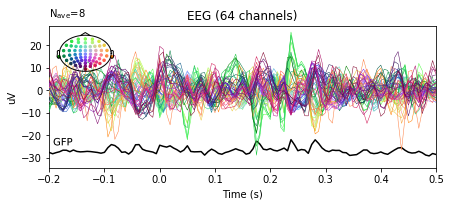

In [223]:
left.plot(spatial_colors=True, gfp=True, picks='eeg')

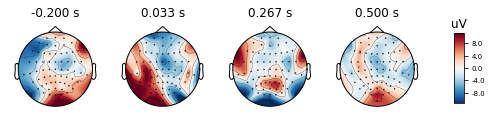

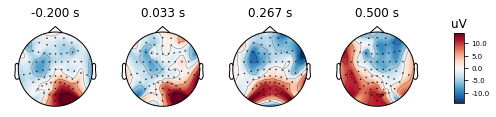

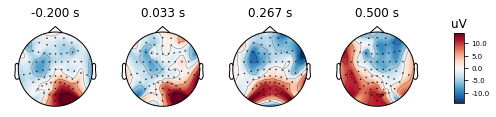

In [226]:
left.plot_topomap(time_unit='s')
right.plot_topomap(time_unit='s')

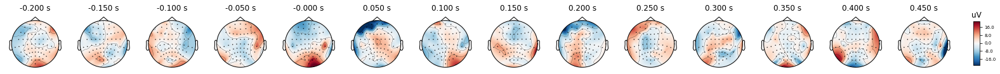

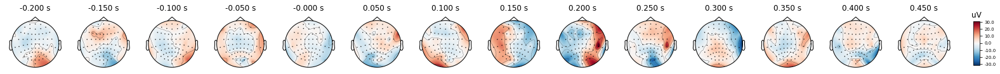

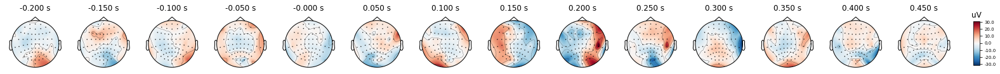

In [231]:
times = np.arange(-0.2, 0.5, 0.05)
left.plot_topomap(times=times, ch_type='eeg', time_unit='s')
right.plot_topomap(times=times, ch_type='eeg', time_unit='s')

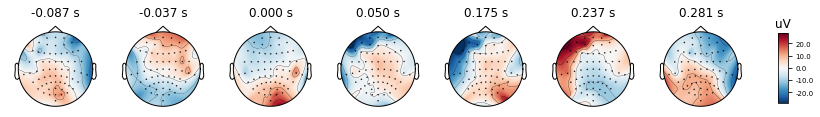

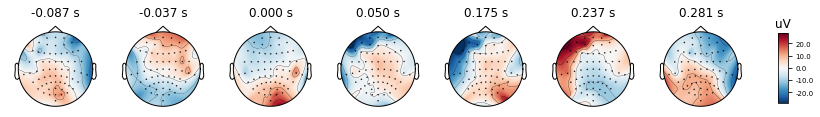

In [232]:
left.plot_topomap(times='peaks', ch_type='eeg', time_unit='s')

In [245]:
data.shape

(64, 113)